In [1]:
!git clone https://github.com/rslim087a/track

Cloning into 'track'...
remote: Enumerating objects: 12163, done.
remote: Total 12163 (delta 0), reused 0 (delta 0), pack-reused 12163
Receiving objects: 100% (12163/12163), 156.98 MiB | 16.38 MiB/s, done.
Updating files: 100% (12160/12160), done.


In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tensorflow import keras
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense, Conv2D
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
import pandas as pd
import ntpath # this 'ntpath' mmodule is imported to split a full path into directory/head and actual filename
import random

In [3]:
datadir = 'track'
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv('/content/track/driving_log.csv', names = columns)
pd.set_option('display.max_colwidth', None)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_670.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_670.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_724.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_724.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_792.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_792.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_860.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_860.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


In [4]:
def path_leaf(path):
  head, tail = ntpath.split(path)
  return tail
data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2018_07_16_17_11_43_382.jpg,left_2018_07_16_17_11_43_382.jpg,right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,center_2018_07_16_17_11_43_670.jpg,left_2018_07_16_17_11_43_670.jpg,right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,center_2018_07_16_17_11_43_724.jpg,left_2018_07_16_17_11_43_724.jpg,right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,center_2018_07_16_17_11_43_792.jpg,left_2018_07_16_17_11_43_792.jpg,right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,center_2018_07_16_17_11_43_860.jpg,left_2018_07_16_17_11_43_860.jpg,right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


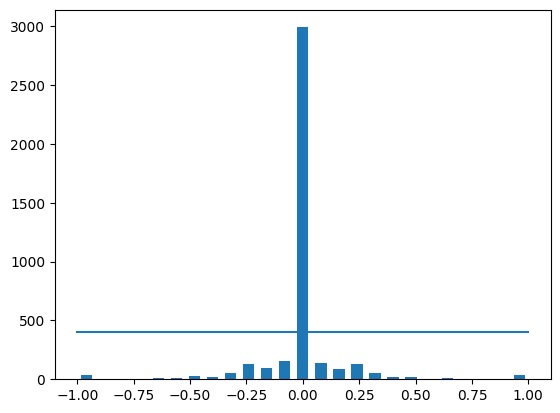

In [5]:
num_bins = 25
samples_per_bin = 400
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1]+ bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

The line `hist, bins = np.histogram(data['steering'], num_bins)` is used to compute the histogram of the `steering` data. Here’s a detailed breakdown:

- `data['steering']` is the column of steering values from the DataFrame `data`.
- `num_bins` is the number of bins you want to divide the data into.

The `np.histogram` function returns two arrays:
1. `hist`: An array of counts representing the number of steering values in each bin.
2. `bins`: An array of bin edges, including the left edge of the first bin and the right edge of the last bin.

Here's how it works:

1. **Binning the Data**:
   - The `np.histogram` function divides the range of the `steering` data into `num_bins` equal-width bins.
   - For example, if the range of steering values is from `-1` to `1` and `num_bins` is `10`, the data will be divided into 10 bins of width `0.2` each: `[-1, -0.8, -0.6, ..., 0.8, 1]`.

2. **Counting Data Points**:
   - The function counts the number of data points (steering values) that fall into each bin.
   - The result is stored in the `hist` array. If there are `10` bins, `hist` will be an array of `10` counts, each representing the number of steering values within the corresponding bin range.

Here’s an example with some sample data:

```python
import numpy as np

# Sample steering data
steering_data = np.array([-0.5, -0.2, 0.1, 0.2, 0.4, 0.5, 0.7, 0.9, 1.0, -0.8, -0.6])

# Number of bins
num_bins = 5

# Compute the histogram
hist, bins = np.histogram(steering_data, num_bins)

print("Histogram counts:", hist)
print("Bin edges:", bins)
```

This will output something like:

```
Histogram counts: [2 2 1 2 4]
Bin edges: [-0.8 -0.4  0.   0.4  0.8  1.2]
```

- `hist`: The counts of steering values in each of the 5 bins.
- `bins`: The edges of the 5 bins. For instance, the first bin is from `-0.8` to `-0.4`, the second bin is from `-0.4` to `0.0`, and so on.

This information can then be used to create histograms or further analyze the distribution of the steering values.

The line `plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))` plots a horizontal line at the level of `samples_per_bin` across the range of steering values in the dataset.

Here's a breakdown of what this line does:

- `np.min(data['steering'])` and `np.max(data['steering'])` determine the minimum and maximum values of the `steering` column in the `data` DataFrame. These values form the x-coordinates of the endpoints of the line.
- `(samples_per_bin, samples_per_bin)` creates a tuple with two identical values of `samples_per_bin`, which forms the y-coordinates of the endpoints of the line.
- `plt.plot()` is used to create a line plot. By specifying the x-coordinates as the minimum and maximum steering values and the y-coordinates as a constant value (`samples_per_bin`), a horizontal line is drawn at the height of `samples_per_bin`.

This line essentially spans the entire range of steering values and maintains a constant y-value of `samples_per_bin`, creating a horizontal line at that level.

The line plt.plot((-0.5, 0.5), (100, 100)) will create a horizontal line that starts at the point (-0.5, 100) and ends at the point (0.5, 100). The y-coordinate is 100 for both points, making the line horizontal.

In [6]:
print('total data:', len(data))
print(data.shape)

total data: 4053
(4053, 7)


In [7]:
remove_list = []
for j in range(num_bins):
  list_ = []
  for i in range(len(data['steering'])):
    if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
      list_.append(i)
  list_ = shuffle(list_)
  list_ = list_[samples_per_bin:]
  remove_list.extend(list_) # entend() inserets list_ in remove_list at end
print('removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining:', len(data))

removed: 2590
remaining: 1463


The line data.drop(data.index[remove_list], inplace=True) is used to remove specific rows from a DataFrame based on their indices. Here's a detailed breakdown:

Dropping Rows:
1. **data.drop(...)**: The drop method is used to remove rows or columns from a DataFrame.
2. **data.index[remove_list]**: This part selects the indices of the rows to be removed from the DataFrame. remove_list contains the indices of the rows that need to be dropped.
3. **inplace=True**: This parameter makes the changes directly to the original DataFrame without returning a new DataFrame.




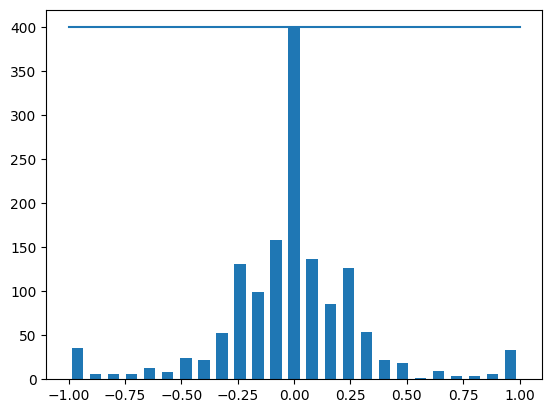

In [8]:
hist, _ = np.histogram(data['steering'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [9]:
def load_img_steering(datadir, df):
  image_path = []
  steering = []
  for i in range(len(data)):
    indexed_data = data.iloc[i]
    center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
    image_path.append(os.path.join(datadir, center.strip()))
    steering.append(float(indexed_data[3]))
    # left image append
    image_path.append(os.path.join(datadir,left.strip()))
    steering.append(float(indexed_data[3])+0.15)
    # right image append
    image_path.append(os.path.join(datadir,right.strip()))
    steering.append(float(indexed_data[3])-0.15)
  image_paths = np.asarray(image_path)
  steerings = np.asarray(steering)
  return image_paths, steerings

In [10]:
image_paths, steerings = load_img_steering(datadir + '/IMG', data)

In [11]:
len(image_paths)

4389

In [12]:
len(steerings)

4389

In [13]:
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))

Training Samples: 3511
Valid Samples: 878


Text(0.5, 1.0, 'Validation set')

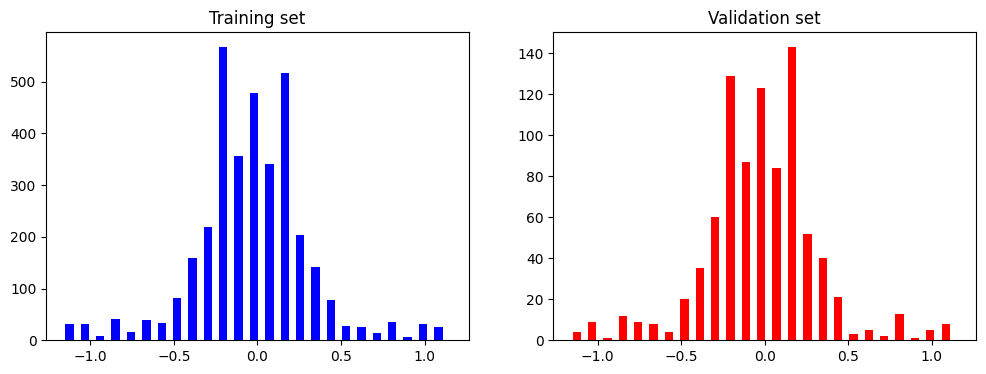

In [14]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')

Text(0.5, 1.0, 'Zoomed Image')

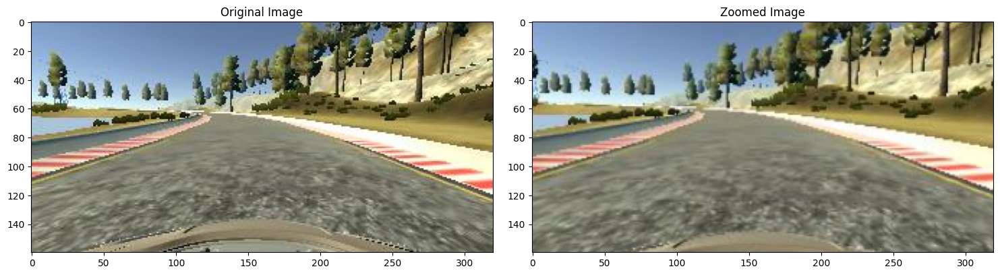

In [15]:
def zoom(image):
  zoom = iaa.Affine(scale=(1, 1.3))
  image = zoom.augment_image(image)
  return image


image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')


Text(0.5, 1.0, 'Panned Image')

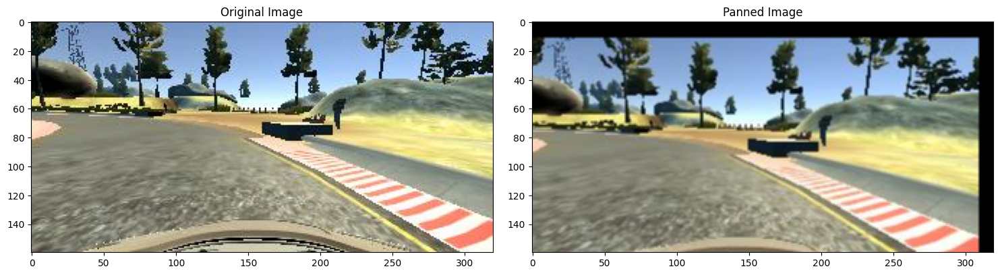

In [16]:
def pan(image):
  pan = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y": (-0.1, 0.1)}) # in x axis from left reduce 10%,from right increase 10% ; similarly in y axis from top and bottom
  image = pan.augment_image(image)
  return image

image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')


Text(0.5, 1.0, 'Brightness altered image ')

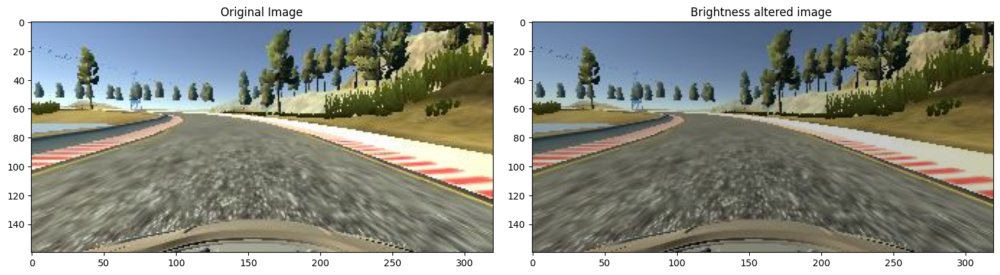

In [17]:
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image

image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)


fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ')



Parameters:
1. (0.2, 1.2): This tuple specifies the range of the multiplication factor.

 a. 0.2 is the minimum factor, which darkens the image.

 b. 1.2 is the maximum factor, which brightens the image.

Text(0.5, 1.0, 'Flipped Image - Steering Angle:0.44999999999999996')

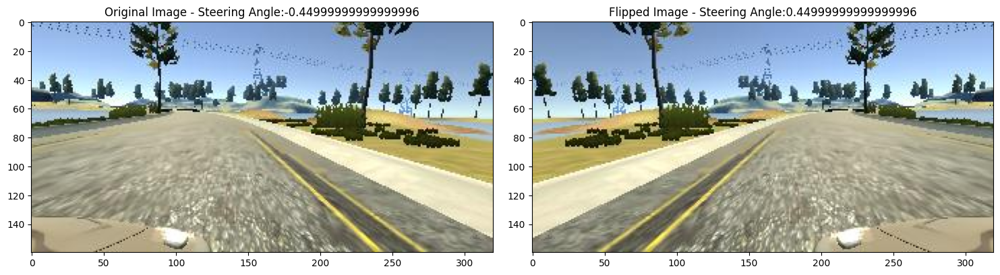

In [18]:
def img_random_flip(image, steering_angle):
    image = cv2.flip(image,1)
    # The flipCode can have the following values:
    #  1: Flip horizontally around the y-axis.
    #  0: Flip vertically around the x-axis.
    # -1: Flip both horizontally and vertically.
    steering_angle = -steering_angle
    return image, steering_angle

random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]

original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))

axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))


In [19]:
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
      image = pan(image)
    if np.random.rand() < 0.5:
      image = zoom(image)
    if np.random.rand() < 0.5:
      image = img_random_brightness(image)
    if np.random.rand() < 0.5:
      image, steering_angle = img_random_flip(image, steering_angle)

    return image, steering_angle

**testing data augmentation**

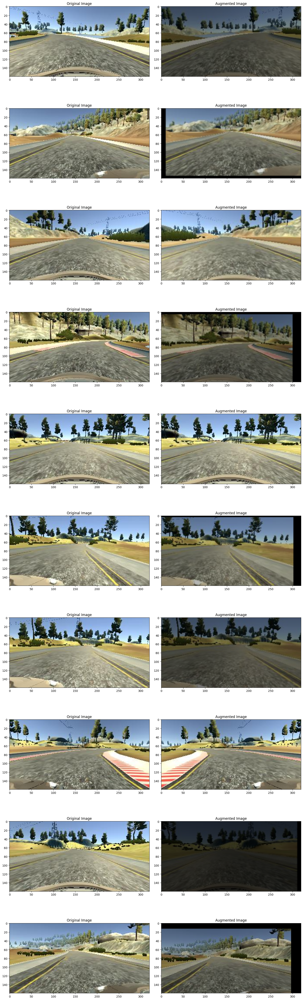

In [20]:
ncol = 2
nrow = 10

fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()

for i in range(10):
  randnum = random.randint(0, len(image_paths) - 1)
  random_image = image_paths[randnum]
  random_steering = steerings[randnum]

  original_image = mpimg.imread(random_image)
  augmented_image, steering = random_augment(random_image, random_steering)

  axs[i][0].imshow(original_image)
  axs[i][0].set_title("Original Image")

  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title("Augmented Image")

In [21]:
def img_preprocess(img):
    img = img[60:135,:,:]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img,  (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img

Sure, here’s a line-by-line explanation of the `img_preprocess` function:

```python
def img_preprocess(img):
```
- This defines a function named `img_preprocess` that takes an image `img` as its input.

```python
    img = img[60:135, :, :]
```
- This line crops the image.
- `img[60:135, :, :]` selects the rows from index `60` to `134` (the end index is exclusive) and includes all columns and color channels. This effectively crops out a section of the image, typically used to focus on the road ahead in autonomous driving applications, removing irrelevant parts like the sky and car hood.

```python
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
```
- This converts the color space of the image from RGB to YUV using OpenCV's `cvtColor` function.
- YUV color space separates image luminance (Y) from chrominance (U and V), which can be beneficial for certain image processing tasks, such as highlighting road features.

```python
    img = cv2.GaussianBlur(img, (3, 3), 0)
```
- This applies a Gaussian blur to the image using OpenCV's `GaussianBlur` function.
- The kernel size is `(3, 3)`, which means a 3x3 filter is applied. The `0` is the standard deviation in the X direction, and it is automatically calculated based on the kernel size.
- Gaussian blur helps in reducing image noise and detail, making it easier for subsequent processing steps to focus on more prominent features.

```python
    img = cv2.resize(img, (200, 66))
```
- This resizes the image to a resolution of 200x66 pixels using OpenCV's `resize` function.
- This specific size is often chosen for compatibility with certain neural network input dimensions, especially in autonomous driving models.

```python
    img = img / 255
```
- This normalizes the pixel values of the image by dividing by 255.
- Pixel values are originally in the range [0, 255]. Dividing by 255 scales them to the range [0, 1], which is a common preprocessing step for neural networks to improve convergence during training.

```python
    return img
```
- This returns the preprocessed image.

### Summary
The `img_preprocess` function performs the following steps on the input image:
1. Crops the image to focus on the relevant part (the road).
2. Converts the image color space from RGB to YUV.
3. Applies a Gaussian blur to reduce noise and detail.
4. Resizes the image to 200x66 pixels.
5. Normalizes the pixel values to the range [0, 1].
6. Returns the preprocessed image, which is now ready for further processing or input into a neural network.

Text(0.5, 1.0, 'Preprocessed Image')

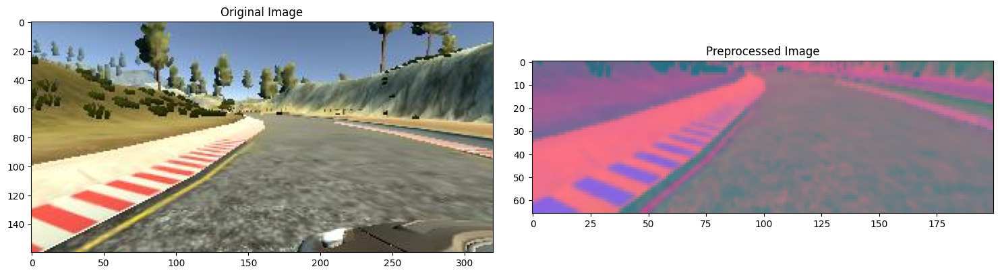

In [22]:
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

In [23]:

!nvidia-smi

Sat Jul 13 13:59:57 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   45C    P8              11W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [24]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):

  while True:
    batch_img = []
    batch_steering = []

    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths) - 1)

      if istraining:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index])

      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]

      im = img_preprocess(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield (np.asarray(batch_img), np.asarray(batch_steering))

The line `yield (np.asarray(batch_img), np.asarray(batch_steering))` is used in Python to create a generator function that yields batches of data. Here's a breakdown of what this line does:

### Yield Statement
- `yield`: In Python, `yield` is used in generator functions to return a series of values, one at a time, rather than returning all the values at once like a regular function would with `return`.
- Generators are iterators that can be iterated over only once and do not store the entire sequence of values in memory, making them memory efficient for large datasets.

### `(np.asarray(batch_img), np.asarray(batch_steering))`
- This expression creates a tuple containing:
  - `np.asarray(batch_img)`: Converts `batch_img`, which is a list of images, into a numpy array. `batch_img` typically contains a batch of preprocessed images.
  - `np.asarray(batch_steering)`: Converts `batch_steering`, which is a list of steering angles corresponding to the images in `batch_img`, into a numpy array.
- `batch_img` and `batch_steering` are assumed to be lists containing image data and steering angle data, respectively, for a batch of training samples.

### Purpose
- The `yield` statement allows the generator function to return a batch of data `(batch_img, batch_steering)` each time it's called.
- This is particularly useful for training machine learning models in batches, where each batch consists of a set number of training samples.
- The generator function can then be iterated over in a loop to obtain batches of data during model training, without needing to load the entire dataset into memory at once.

### Example Usage
Here’s a simplified example to illustrate how you might use such a generator function:

```python
import numpy as np

def data_generator(data, batch_size=32):
    num_samples = len(data)
    while True:  # Infinite loop for continuous data generation
        indices = np.random.randint(0, num_samples, batch_size)
        batch_img = [data[i]['image'] for i in indices]
        batch_steering = [data[i]['steering'] for i in indices]
        yield (np.asarray(batch_img), np.asarray(batch_steering))

# Example usage
# Assuming 'data' is a list of dictionaries containing 'image' and 'steering' data
data = [{'image': np.random.rand(66, 200, 3), 'steering': np.random.uniform(-1, 1)} for _ in range(100)]

# Create a generator instance
generator = data_generator(data, batch_size=10)

# Get batches of data using next()
batch_img, batch_steering = next(generator)
print("Batch image shape:", batch_img.shape)
print("Batch steering shape:", batch_steering.shape)
```

In this example:
- `data_generator` is a generator function that yields batches of data `(batch_img, batch_steering)`.
- `data` is a list of dictionaries containing simulated image and steering data.
- The generator `generator` is created with `data_generator(data, batch_size=10)`.
- `next(generator)` is used to get the next batch of data `(batch_img, batch_steering)`.

### Summary
- The `yield` statement in Python is used to create generator functions that produce a sequence of values.
- `(np.asarray(batch_img), np.asarray(batch_steering))` within `yield` returns batches of preprocessed image data and corresponding steering angles.
- Generator functions are memory efficient and useful for training machine learning models in batches.

yield is used instead of return in the batch_generator function to create a generator that continuously yields batches of image data and steering angles. This approach ensures memory efficiency and allows for seamless iteration over batches during model training or evaluation.

in simple terms 'yield' is dividing inbatches and now next() is used to retrieve batch wise from the generator

In [25]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))

Text(0.5, 1.0, 'Validation Image')

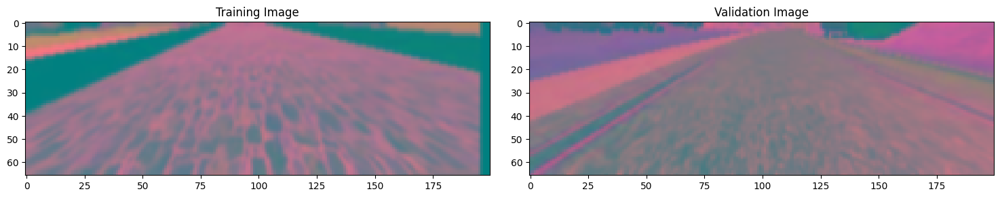

In [26]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

In [27]:
def nvidia_model():
  model = Sequential()
  model.add(Conv2D(24, (5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
  model.add(Conv2D(36, (5, 5), strides=(2, 2), activation='elu'))
  model.add(Conv2D(48, (5, 5), strides=(2, 2), activation='elu'))
  model.add(Conv2D(64, (5, 5), activation='elu'))
  # model.add(Conv2D(64, (3,3), activation='elu'))
#   model.add(Dropout(0.5))


  model.add(Flatten())

  model.add(Dense(100, activation = 'elu'))
#   model.add(Dropout(0.5))

  model.add(Dense(50, activation = 'elu'))
#   model.add(Dropout(0.5))

  model.add(Dense(10, activation = 'elu'))
#   model.add(Dropout(0.5))

  model.add(Dense(1))

  optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
  model.compile(loss='mse', optimizer=optimizer)
  return model

model = nvidia_model()
print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 31, 98, 24)        1824      
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 47, 36)        21636     
                                                                 
 conv2d_2 (Conv2D)           (None, 5, 22, 48)         43248     
                                                                 
 conv2d_3 (Conv2D)           (None, 1, 18, 64)         76864     
                                                                 
 flatten (Flatten)           (None, 1152)              0         
                                                                 
 dense (Dense)               (None, 100)               115300    
                                                                 
 dense_1 (Dense)             (None, 50)                5

In [28]:
history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),
                                  steps_per_epoch=300,
                                  epochs=10,
                                  validation_data=batch_generator(X_valid, y_valid, 100, 0),
                                  validation_steps=200,
                                  verbose=1,
                                  shuffle = 1)


<ipython-input-28-5e06e4a40b5f>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),


Epoch 1/10
300/300 [==============================] - 141s 446ms/step - loss: 0.1211 - val_loss: 0.0567
Epoch 2/10
300/300 [==============================] - 116s 387ms/step - loss: 0.0703 - val_loss: 0.0500
Epoch 3/10
300/300 [==============================] - 122s 408ms/step - loss: 0.0605 - val_loss: 0.0408
Epoch 4/10
300/300 [==============================] - 118s 395ms/step - loss: 0.0548 - val_loss: 0.0348
Epoch 5/10
300/300 [==============================] - 119s 398ms/step - loss: 0.0489 - val_loss: 0.0312
Epoch 6/10
300/300 [==============================] - 123s 410ms/step - loss: 0.0474 - val_loss: 0.0348
Epoch 7/10
300/300 [==============================] - 123s 410ms/step - loss: 0.0443 - val_loss: 0.0292
Epoch 8/10
300/300 [==============================] - 110s 367ms/step - loss: 0.0433 - val_loss: 0.0297
Epoch 9/10
300/300 [==============================] - 135s 453ms/step - loss: 0.0409 - val_loss: 0.0270
Epoch 10/10
300/300 [==============================] - 115s 384m

Text(0.5, 0, 'Epoch')

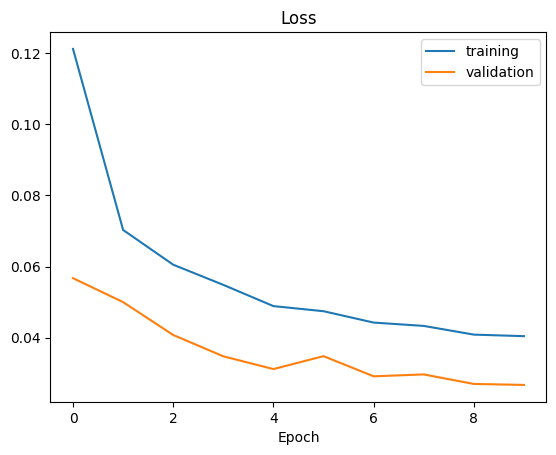

In [29]:

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')

In [30]:
model.save('model.h5')
from google.colab import files
files.download('model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>